In [40]:
!pip install --upgrade diffusers accelerate transformers

In [41]:
from diffusers import DiffusionPipeline

pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", use_safetensors=True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [42]:
pipeline

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.27.2",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [43]:
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
pipeline.to(device)

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.27.2",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [44]:
image = pipeline("an image of a ball").images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

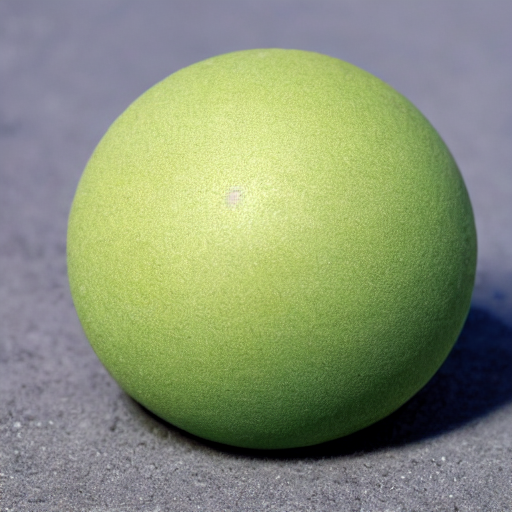

In [45]:
image

In [46]:
image.save("image_of_ball.png")

In [47]:
#change scheduler

from diffusers import EulerDiscreteScheduler

pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)

In [48]:
image = pipeline("an image of a ball").images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

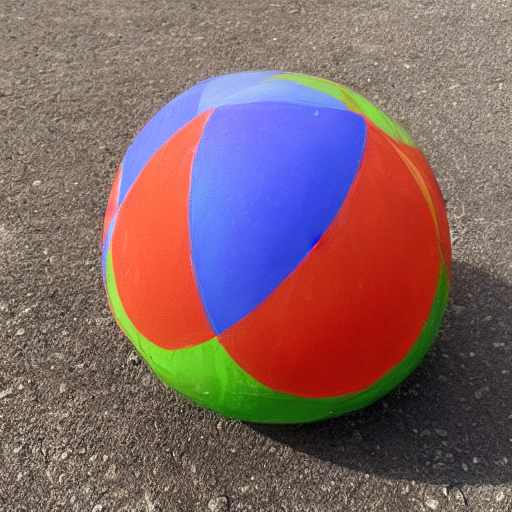

In [49]:
image

In [50]:
prompt = "an image of a ball"

def get_inputs(batch_size=1):
  prompts = batch_size * [prompt]
  generators = [torch.Generator(device).manual_seed(i) for i in range(batch_size)]
  num_inference_steps = 20
  return {"prompt": prompts, "generator": generators, "num_inference_steps": num_inference_steps}

In [51]:
from diffusers import DDPMScheduler

pipeline.scheduler = DDPMScheduler.from_config(pipeline.scheduler.config)

  0%|          | 0/20 [00:00<?, ?it/s]

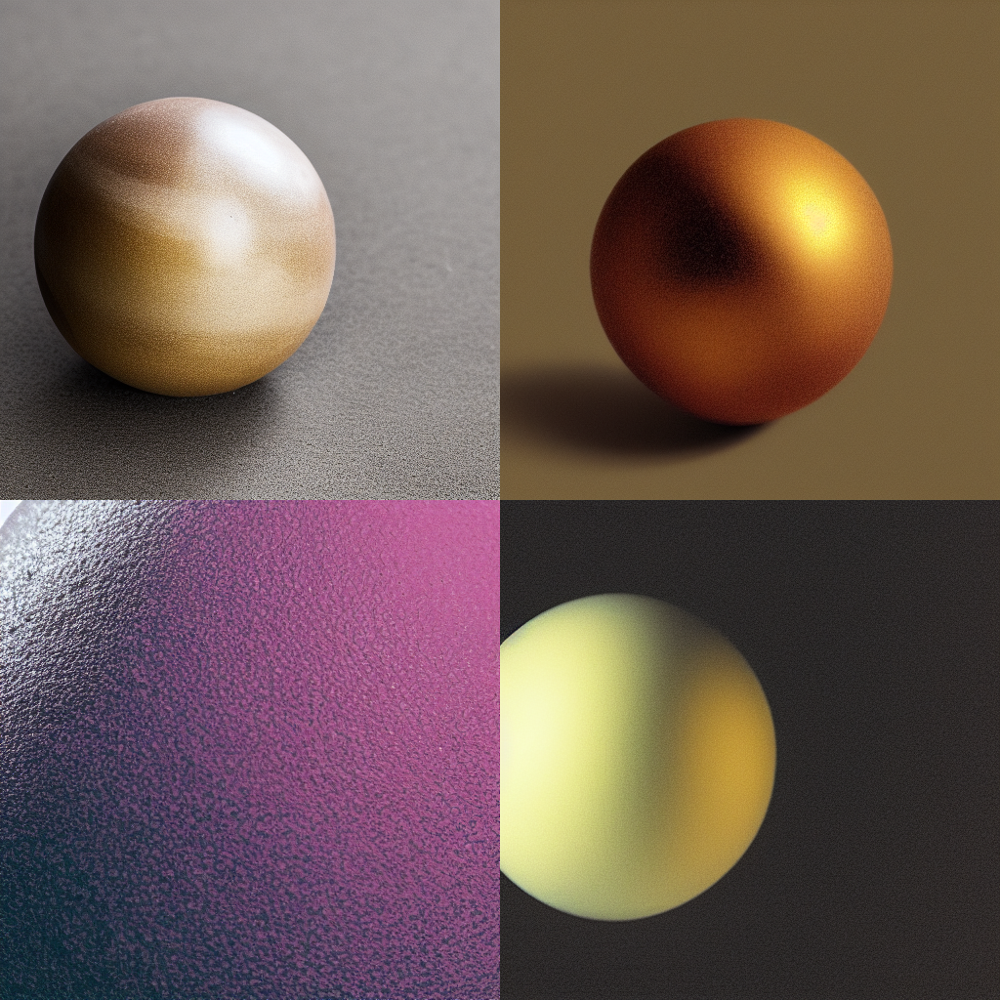

In [52]:
from diffusers.utils import make_image_grid

images = pipeline(**get_inputs(4)).images

make_image_grid(images, 2, 2)

In [53]:
from diffusers import AutoencoderKL

In [54]:
pipeline.vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").to(device)

In [55]:
images = pipeline(**get_inputs(4)).images

  0%|          | 0/20 [00:00<?, ?it/s]

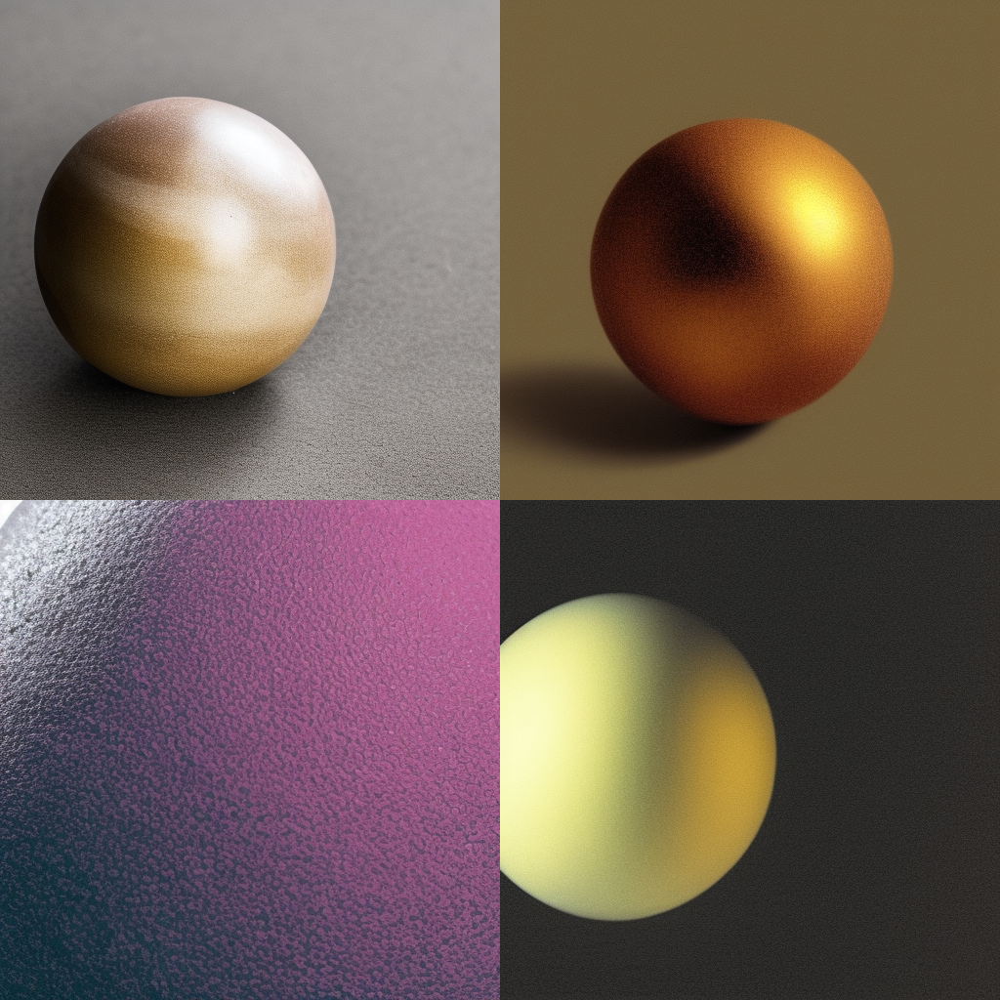

In [56]:
make_image_grid(images, 2, 2)

In [57]:
from diffusers import DDPMScheduler, UNet2DModel

In [58]:
scheduler = DDPMScheduler.from_pretrained("google/ddpm-cat-256")
model = UNet2DModel.from_pretrained("google/ddpm-cat-256", use_safetensors=True).to(device)

In [59]:
scheduler.set_timesteps(50)

In [60]:
scheduler.timesteps

tensor([980, 960, 940, 920, 900, 880, 860, 840, 820, 800, 780, 760, 740, 720,
        700, 680, 660, 640, 620, 600, 580, 560, 540, 520, 500, 480, 460, 440,
        420, 400, 380, 360, 340, 320, 300, 280, 260, 240, 220, 200, 180, 160,
        140, 120, 100,  80,  60,  40,  20,   0])

In [61]:
import torch

sample_size = model.config.sample_size
noise = torch.randn((1, 3, sample_size, sample_size), device=device) #1=batch_size, 3=colour_channels, sample_size = w, h

In [62]:
input = noise

for t in scheduler.timesteps:
  with torch.no_grad():
    noisy_residual = model(input, t).sample  # noisy_residual = predicted epsilon
  previous_noisy_sample = scheduler.step(noisy_residual, t, input).prev_sample
  input = previous_noisy_sample

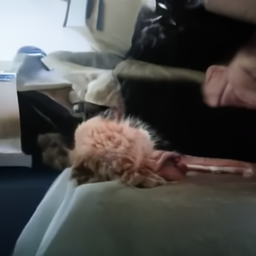

In [63]:
from PIL import Image
import numpy as np

image = (input / 2 + 0.5).clamp(0, 1).squeeze()
image = (image.permute(1,2,0) * 255).round().to(torch.uint8).cpu().numpy()
image = Image.fromarray(image)
image

In [64]:
from PIL import Image
import torch
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

In [65]:
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae", use_safetensors=True).to(device)
tokenizer = CLIPTokenizer.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(
    "CompVis/stable-diffusion-v1-4", subfolder="text_encoder", use_safetensors=True
).to(device)
unet = UNet2DConditionModel.from_pretrained(
    "CompVis/stable-diffusion-v1-4", subfolder="unet", use_safetensors=True
).to(device)

In [66]:
from diffusers import UniPCMultistepScheduler

scheduler = UniPCMultistepScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

In [67]:
prompt = ["red ball"]
height = 512 # default height of Stable Diffusion
width = 512 # default width of Stable Diffusion
num_inference_steps = 25 # Number of denoising steps
guidance_scale = 7.5 # Seed generator to create the initial latent noise
generator = torch.cuda.manual_seed(0) # Seed generator to create the initial latent noise
batch_size = len(prompt)

In [68]:
text_input = tokenizer(
    prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
)

with torch.no_grad():
  text_embeddings = text_encoder(text_input.input_ids.to(device))[0]

In [69]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(device))[0]

In [70]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

In [71]:
device

'cuda'

In [72]:
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=generator,
    device=device
)

In [73]:
print("Latents shape:", latents.shape)
print("Text embeddings shape:", text_embeddings.shape)

Latents shape: torch.Size([1, 4, 64, 64])
Text embeddings shape: torch.Size([2, 77, 768])


In [74]:
from tqdm.auto import tqdm

scheduler.set_timesteps(num_inference_steps)

for t in tqdm(scheduler.timesteps):
  # expand the latents if we are doing classifier free guidance to avoid doing two forward passes.
  latent_model_input = torch.cat([latents] * 2) * scheduler.init_noise_sigma

  latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

  # predict the noise residual
  with torch.no_grad():
    noise_pred = unet(sample=latent_model_input, timestep=t, encoder_hidden_states=text_embeddings)[0]

  # perform guidance (classifier-free)
  noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
  noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

  # compute the previous noisy sample X_t -> X_(t -1)
  latents = scheduler.step(noise_pred, t, latents).prev_sample

  0%|          | 0/25 [00:00<?, ?it/s]

In [75]:
#scale and decode the image latents with vae
latents = 1 / 0.18215 * latents
with torch.no_grad():
  image = vae.decode(latents).sample

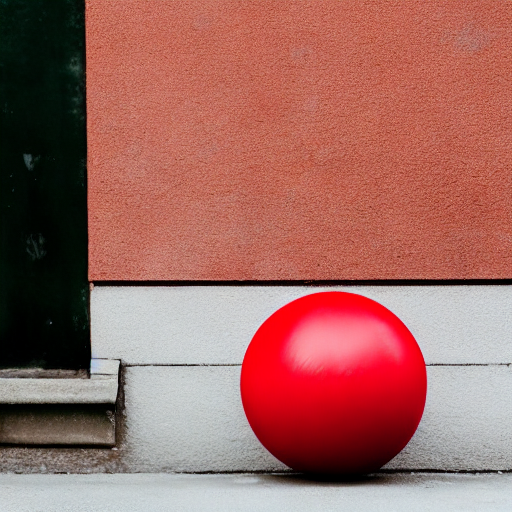

In [76]:
image = (image / 2 + 0.5).clamp(0, 1).squeeze()
image = (image.permute(1,2,0) * 255).to(torch.uint8).cpu().numpy()
image = Image.fromarray(image)
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

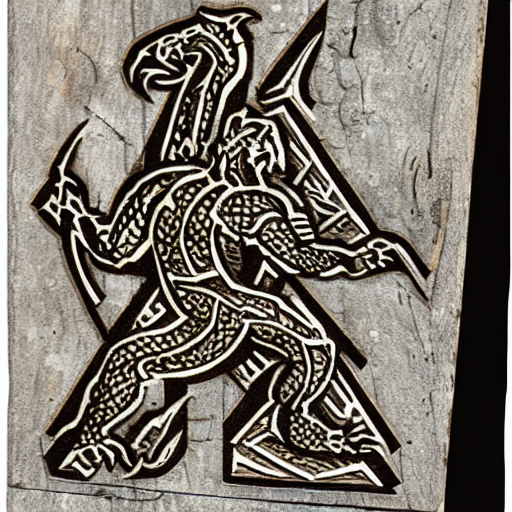

In [77]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, use_safetensors=True
).to(device)
prompt = "peasant and dragon combat, wood cutting style, viking era, bevel with rune"

image = pipeline(prompt, num_inference_steps=25).images[0]
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

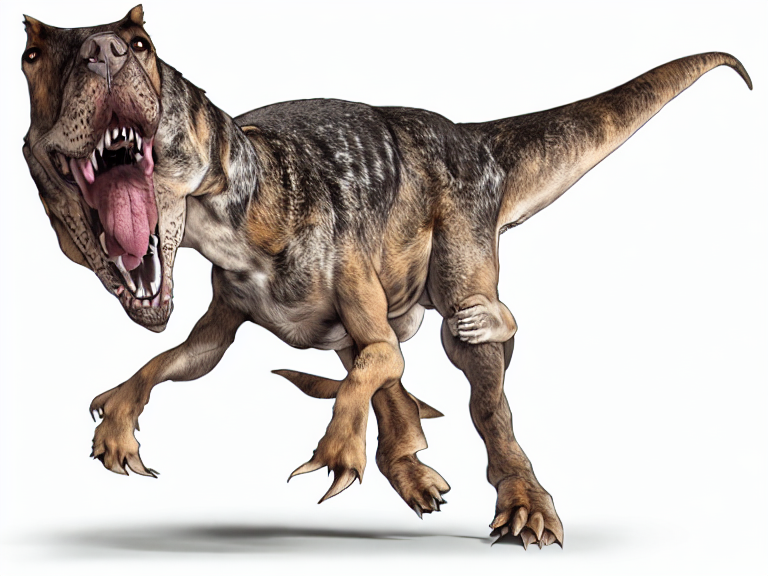

In [83]:
from diffusers import AutoPipelineForImage2Image
import torch
import requests
from PIL import Image
from io import BytesIO

pipel1ne = AutoPipelineForImage2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, use_safetensors=True
).to(device)
prompt = "a portrait of a dog with a dinosaur body"

url = "https://th.bing.com/th/id/R.eb080f07359ca7c147b966bafde8fc2c?rik=NLOtuLVOme2sXw&pid=ImgRaw&r=0"
response = requests.get(url)
image = Image.open(BytesIO(response.content)).convert("RGB")
image.thumbnail((768, 768))

image = pipel1ne(prompt, image, num_inference_steps=200, strength=0.6, guidance_scale=15).images[0]
image

  0%|          | 0/120 [00:00<?, ?it/s]

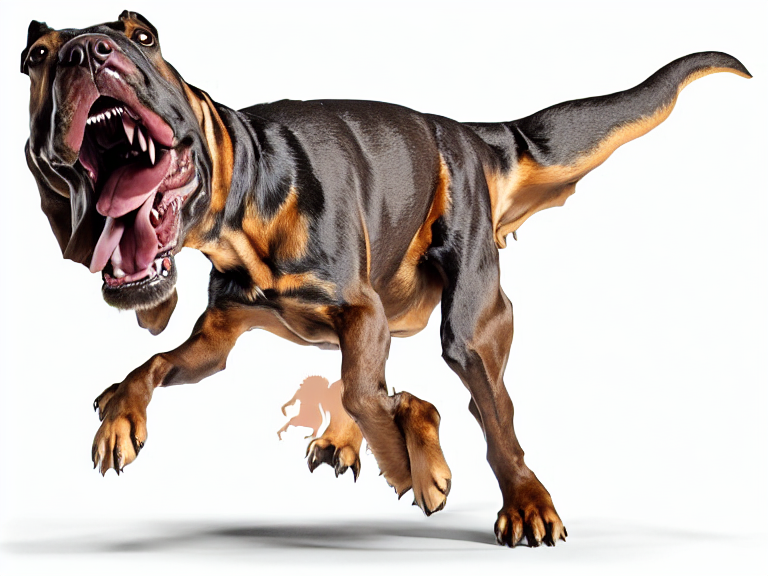

In [84]:
url = "https://th.bing.com/th/id/R.eb080f07359ca7c147b966bafde8fc2c?rik=NLOtuLVOme2sXw&pid=ImgRaw&r=0"
response = requests.get(url)
image = Image.open(BytesIO(response.content)).convert("RGB")
image.thumbnail((768, 768))

image = pipel1ne(prompt, image, num_inference_steps=200, strength=0.6, guidance_scale=15).images[0]
image

  0%|          | 0/120 [00:00<?, ?it/s]

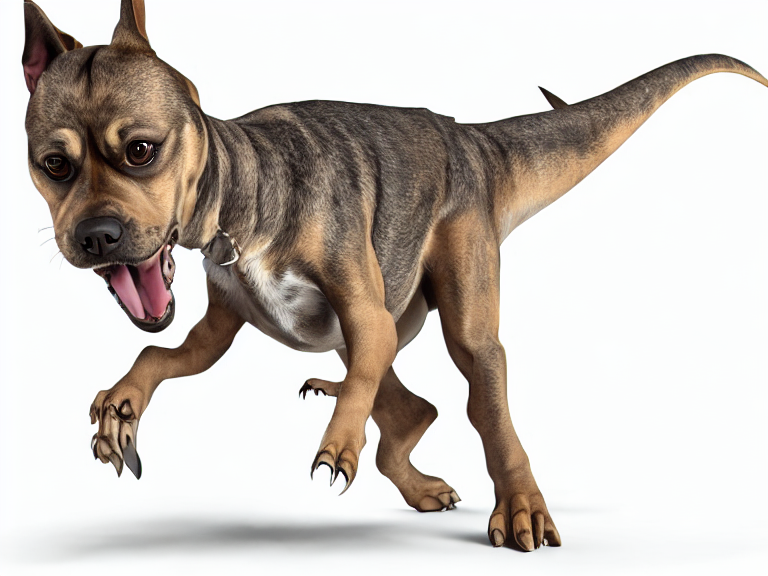

In [85]:
url = "https://th.bing.com/th/id/R.eb080f07359ca7c147b966bafde8fc2c?rik=NLOtuLVOme2sXw&pid=ImgRaw&r=0"
response = requests.get(url)
image = Image.open(BytesIO(response.content)).convert("RGB")
image.thumbnail((768, 768))

image = pipel1ne(prompt, image, num_inference_steps=200, strength=0.6, guidance_scale=10).images[0]
image